In [1]:
using Pkg
Pkg.activate("../")
Pkg.status()

  Activating environment at `~/WORK/HPL/Code/ina-julia/Project.toml`


      Status `~/WORK/HPL/Code/ina-julia/Project.toml`
  [6e4b80f9] BenchmarkTools v1.1.4
  [a134a8b2] BlackBoxOptim v0.6.0
  [336ed68f] CSV v0.9.0
  [a93c6f00] DataFrames v1.2.2
  [0c46a032] DifferentialEquations v6.18.0
  [587475ba] Flux v0.12.6
  [a75be94c] GalacticOptim v2.0.3
  [7073ff75] IJulia v1.23.2
  [429524aa] Optim v1.4.1
  [91a5bcdd] Plots v1.21.3
  [c3572dad] Sundials v4.5.3


# Load packages

In [2]:
using DifferentialEquations
using Sundials
using DataFrames: DataFrame
using CSV: File as CSVFile

using Plots
using BenchmarkTools

using Parameters
using Setfield

┌ Warning: Replacing module `NLsolve`
└ @ Base loading.jl:959


# Load CSV

In [521]:
dirname_data = "../data"
dirname_legends = joinpath(dirname_data, "legends")
dirname_protocols = joinpath(dirname_data, "protocols")

filename_legend_constants = joinpath(dirname_legends, "legend_constants_v2.csv")
filename_legend_states = joinpath(dirname_legends, "legend_states.csv")
filename_protocol = joinpath(dirname_protocols, "protocol_sparse_v2.csv");

In [522]:
read_csv(filename) = DataFrame(CSVFile(filename))

read_csv (generic function with 1 method)

In [523]:
legend_states = read_csv(filename_legend_states)
legend_constants = read_csv(filename_legend_constants)
protocol = read_csv(filename_protocol);

In [524]:
find_step(t, protocol) = protocol.v[findfirst(x -> x >= t, protocol.t)]

function create_p_from_legend(legend)
    name = Symbol.(legend_constants.name)
    value = legend_constants.value
    p = (; zip(name, value)...)
end

create_p_from_legend (generic function with 1 method)

# Load equations

In [526]:
include("../src/models/ina.jl");
include("../src/models/currents.jl");

# Define model

In [527]:
function compute_algebraic(du, u, p, t)
    
    v_comp, v_p, v_m, m, h, j, I_out = u
        
    tau_m  = calculate_tau_m(v_m, p)
    tau_h  = calculate_tau_h(v_m, p)
    tau_j  = calculate_tau_j(v_m, p)
    
    m_inf  = calculate_m_inf(v_m, p)
    h_inf  = calculate_h_inf(v_m, p)
    
    v_cp   = calculate_v_cp(v_comp, p)

    I_leak = 0 # calculate_I_leak(v_m, p)
    I_Na   = calculate_I_Na(v_m, m, h, j, p)
    I_c    = 0 # calculate_I_c(v_m, v_cp, I_leak, I_Na,  p)  # or calculate_I_c(v_m, v_p, I_leak, I_Na,  p)
    I_p    = 0  # or calculate_I_p(v_cp, v_p, p)
    I_comp = 0 # calculate_I_comp(v_comp, p)
    
    I_in   = I_leak + I_Na + I_c - I_comp + I_p
    
    a = (;
     tau_m, tau_h, tau_j, m_inf, h_inf,
     v_cp,
     I_leak, I_Na, I_c, I_comp, I_in
    )
    
end

compute_algebraic (generic function with 1 method)

In [528]:
function compute_rates!(du, u, p, t)
    
    v_comp, v_p, v_m, m, h, j, I_out = u
    
    a = compute_algebraic(du, u, p, t)
    
    du[1] = calculate_d_v_comp(v_comp, p)  # v_comp
    
    @unpack v_cp, I_leak, I_Na = a
    du[2] = calculate_d_v_p(v_cp, v_p, p)  # v_p
    du[3] = calculate_d_v_m(v_m, v_p, I_leak, I_Na, p)  # v_m
        
    @unpack m_inf, tau_m, h_inf, tau_h, tau_j = a
    du[4] = calculate_d_gate(m_inf, m, tau_m)  # m
    du[5] = calculate_d_gate(h_inf, h, tau_h)  # h
    du[6] = calculate_d_gate(h_inf, j, tau_j)  # j
        
    @unpack I_in = a
    du[7] = calculate_d_I_out(I_in, I_out, p)  # I_out
    
    nothing
end

compute_rates! (generic function with 1 method)

In [529]:
rhs = ODEFunction(compute_rates!, syms=[:v_comp, :v_p, :v_m, :m, :h, :j, :I_out]);

# Callbacks

In [530]:
function change_step_v1!(integrator)
    t = integrator.t
    v_c = find_step(t, protocol)
    integrator.p["v_c"] = v_c
    set_proposed_dt!(integrator, 1e-9)
    nothing
end

cb_step_v1  = PresetTimeCallback(protocol.t, change_step_v1!, save_positions=(false, false));

# Globals

In [531]:
u₀ = [-80.0, -80.0, -80.0, 0.0, 1.0, 1.0, 0.0];
reltol = 1e-3
abstol = [1e-3, 1e-3, 1e-3, 1e-6, 1e-6, 1e-6, 1e-3]
solver = CVODE_BDF();
tspan_initial = (0., 10.)
tspan = (0., 5.)
saveat = tspan[1]: 5e-5: tspan[2]

0.0:5.0e-5:5.0

# Loss

In [532]:
legend_constants

,name,value,bound_1,bound_2,is_log
,InlineS…,Float64,Float64,Float64,Int64
1,c_p,4.50296e-12,1.0e-14,5.0e-12,1
2,c_m,2.47302e-11,1.0e-11,9.0e-11,1
3,a0_m,16529.1,10000.0,100000.0,1
4,b0_m,386.7,100.0,1000.0,1
5,delta_m,22.823,1.0,100.0,1
6,s_m,12.8321,1.0,100.0,1
7,a0_h,6.26,1.0,100.0,1
8,b0_h,58131.4,10000.0,100000.0,1
9,delta_h,10.2758,1.0,100.0,1


In [533]:
kwargs_loss_robust = (α=-2, c=0.1)

(α = -2, c = 0.1)

In [534]:
p_dict = Dict(zip(legend_constants.name, legend_constants.value));
p_dict["α"] = kwargs_loss_robust.α

-2

In [535]:
p_keys_opt_m = ["a0_m", "s_m", "b0_m", "delta_m", "v_half_m", "k_m"]
p_keys_opt_h = ["a0_h", "s_h", "b0_h", "delta_h", "v_half_h", "k_h"]
p_keys_opt_j = ["tau_j_const", "a0_j", "s_j", "b0_j", "delta_j"]

p_keys_opt_INa = ["g_max", "v_rev"]

p_keys_opt_other = ["α"]  # loss_robust

1-element Vector{String}:
 "α"

In [536]:
# p_keys_opt = vcat(p_keys_opt_m, p_keys_opt_h, p_keys_opt_j)
p_keys_opt = vcat(p_keys_opt_INa, p_keys_opt_other, p_keys_opt_m, p_keys_opt_h)

15-element Vector{String}:
 "g_max"
 "v_rev"
 "α"
 "a0_m"
 "s_m"
 "b0_m"
 "delta_m"
 "v_half_m"
 "k_m"
 "a0_h"
 "s_h"
 "b0_h"
 "delta_h"
 "v_half_h"
 "k_h"

In [537]:
legend_subset = legend_constants[in(p_keys_opt).(legend_constants.name), :]

,name,value,bound_1,bound_2,is_log
,InlineS…,Float64,Float64,Float64,Int64
1,a0_m,16529.1,10000.0,100000.0,1
2,b0_m,386.7,100.0,1000.0,1
3,delta_m,22.823,1.0,100.0,1
4,s_m,12.8321,1.0,100.0,1
5,a0_h,6.26,1.0,100.0,1
6,b0_h,58131.4,10000.0,100000.0,1
7,delta_h,10.2758,1.0,100.0,1
8,s_h,21.62,1.0,100.0,1
9,g_max,8392.4,1000.0,10000.0,1


In [538]:
mask_log = Dict(zip(legend_constants.name,
                    Array{Bool}(legend_constants.is_log)));

In [539]:
mask_log["α"] = Bool(0)

false

In [540]:
function calculate_loss_robust(x; α=2, c=1)
    if α ≈ 2
        loss = 0.5 * (x / 2)^2
    elseif α ≈ 0
        loss = log((x / c)^2 + 1)
#     elseif α > 1e9
#         loss = 1 - exp(-0.5 * (x / c)^2)
    else
        A = abs(α - 2) / α
        B = ((x / c)^2) / abs(α - 2) + 1
        loss = A * (B^(α / 2) - 1)
    end
end

calculate_loss_robust (generic function with 3 methods)

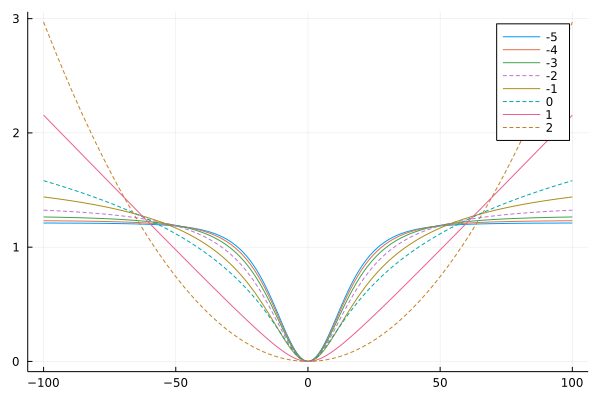

In [541]:
c = 10
α = -2

x = collect(-100 : 1 : 100)

pl = plot()
for α ∈ -5 : 1 : 2
    loss = calculate_loss_robust.(x, α, c)
    loss ./= mean(loss)
    linestyle = α ∈ (2, 0, -2) ? :dash : :solid
    plot!(pl, x, loss, label=α, linestyle=linestyle)
end

display(pl)

In [542]:
function calculate_rmse(x, y)
    se = (x .- y) .^2
    return √mean(se)
end

calculate_rmse (generic function with 1 method)

In [543]:
function prepare_p(x::Vector{Float64})
    
    @assert length(x) == length(p_keys_opt)
    
    p = deepcopy(p_dict)
    for (k, v, is_log) in zip(p_keys_opt, x, mask_log)
        p[k] = mask_log[k] ? exp(v) : v
#         p[k] = v

    end
    
    p["α"] = kwargs_loss_robust.α
    
    return p
    
end

prepare_p (generic function with 1 method)

In [544]:
function solve_model(p)
    
    # print(p)
    prob = ODEProblem(rhs, u₀, tspan, p, callback=cb_step_v1)
    solve_kwargs = (; reltol, abstol, solver, saveat)
    sol = solve(prob; solve_kwargs...)
    # println("full")

    return sol
end

solve_model (generic function with 1 method)

In [545]:
function calculate_loss(x)
    
    p = prepare_p(x)
    sol = solve_model(p)
    
    if sol.retcode ≠ :Success
        loss = Inf
    else
#         loss = calculate_rmse(sol[:I_out], data)
        residuals = sol[:I_out] - data
        loss = calculate_loss_robust.(residuals, α=p["α"], c=kwargs_loss_robust.c)
        loss = mean(loss)
    end
    
    # println(loss)
        
    return loss
    
end

calculate_loss (generic function with 1 method)

# Generate data

In [546]:
x₀ = [mask_log[k] ? log.(p_dict[k]) : p_dict[k] for k in p_keys_opt]

15-element Vector{Float64}:
  9.035081813382545
 18.0
 -2.0
  9.71287532289443
  2.55194984411125
  5.957649198613251
  3.12776879942174
  3.344909882583472
  2.0368954054310784
  1.8341801851120072
  3.073618812211062
 10.970461364771992
  2.3297945357086913
  4.089184103261701
  1.706160004112492

In [547]:
p = prepare_p(x₀);

In [550]:
sol = solve_model(p);

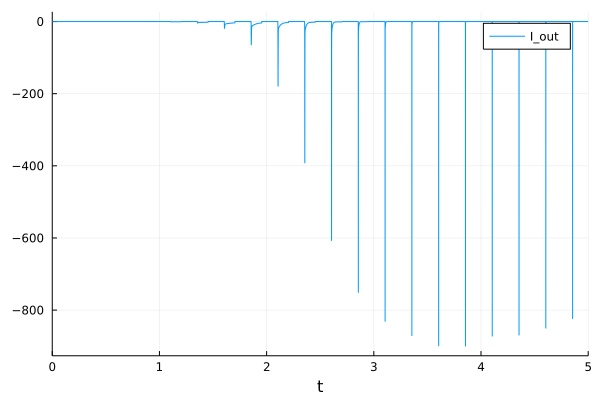

In [551]:
plot(sol, vars=[:I_out])

In [552]:
data = copy(sol[:I_out]);

In [553]:
calculate_loss(x₀)

0.0

# Optimize

In [554]:
using BlackBoxOptim

In [555]:
using PyCall
so = pyimport("scipy.optimize");

In [556]:
bounds = [minmax(x - 1, x + 1) for x in x₀]

15-element Vector{Tuple{Float64, Float64}}:
 (8.035081813382545, 10.035081813382545)
 (17.0, 19.0)
 (-3.0, -1.0)
 (8.71287532289443, 10.71287532289443)
 (1.5519498441112498, 3.55194984411125)
 (4.957649198613251, 6.957649198613251)
 (2.12776879942174, 4.12776879942174)
 (2.344909882583472, 4.344909882583472)
 (1.0368954054310784, 3.0368954054310784)
 (0.8341801851120072, 2.8341801851120074)
 (2.073618812211062, 4.073618812211063)
 (9.970461364771992, 11.970461364771992)
 (1.3297945357086913, 3.3297945357086913)
 (3.089184103261701, 5.089184103261701)
 (0.706160004112492, 2.7061600041124922)

In [557]:
bounds[findfirst(p_keys_opt .== "α")] = (-5, 0)

(-5, 0)

In [558]:
lb = [b[1] for b in bounds]
ub = [b[2] for b in bounds];

In [559]:
x_initial = [b[1] + rand() * (b[2] - b[1]) for b in bounds];

In [560]:
res = bboptimize(calculate_loss; SearchRange=bounds, MaxTime=10 * 60., TraceInterval=10,
                 # PopulationSize=100,
                 );

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


10.64 secs, 33 evals, 17 steps, improv/step: 0.471 (last = 0.4706), fitness=0.354643181


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


20.80 secs, 63 evals, 33 steps, improv/step: 0.455 (last = 0.4375), fitness=0.354643181


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


31.06 secs, 92 evals, 53 steps, improv/step: 0.377 (last = 0.2500), fitness=0.339237202


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/

41.20 secs, 127 evals, 76 steps, improv/step: 0.368 (last = 0.3478), fitness=0.339237202


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


51.54 secs, 162 evals, 99 steps, improv/step: 0.374 (last = 0.3913), fitness=0.339237202


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


61.60 secs, 192 evals, 117 steps, improv/step: 0.376 (last = 0.3889), fitness=0.333012763


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


71.88 secs, 222 evals, 139 steps, improv/step: 0.367 (last = 0.3182), fitness=0.333012763


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


82.09 secs, 254 evals, 164 steps, improv/step: 0.396 (last = 0.5600), fitness=0.332098881


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


92.33 secs, 283 evals, 190 steps, improv/step: 0.416 (last = 0.5385), fitness=0.332098881


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


102.80 secs, 313 evals, 212 steps, improv/step: 0.429 (last = 0.5455), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


113.12 secs, 344 evals, 240 steps, improv/step: 0.429 (last = 0.4286), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


123.17 secs, 377 evals, 270 steps, improv/step: 0.415 (last = 0.3000), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/

133.23 secs, 417 evals, 307 steps, improv/step: 0.391 (last = 0.2162), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


143.29 secs, 443 evals, 333 steps, improv/step: 0.384 (last = 0.3077), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


153.62 secs, 475 evals, 363 steps, improv/step: 0.380 (last = 0.3333), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


163.94 secs, 508 evals, 396 steps, improv/step: 0.364 (last = 0.1818), fitness=0.326210641


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


174.12 secs, 529 evals, 417 steps, improv/step: 0.367 (last = 0.4286), fitness=0.322883169
184.60 secs, 549 evals, 437 steps, improv/step: 0.366 (last = 0.3500), fitness=0.322883169
194.99 secs, 568 evals, 456 steps, improv/step: 0.357 (last = 0.1579), fitness=0.322883169


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


205.08 secs, 591 evals, 478 steps, improv/step: 0.356 (last = 0.3182), fitness=0.322883169


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


215.16 secs, 610 evals, 497 steps, improv/step: 0.350 (last = 0.2105), fitness=0.322883169


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


225.33 secs, 631 evals, 518 steps, improv/step: 0.349 (last = 0.3333), fitness=0.322883169
235.70 secs, 653 evals, 540 steps, improv/step: 0.348 (last = 0.3182), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


245.72 secs, 679 evals, 566 steps, improv/step: 0.339 (last = 0.1538), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


255.91 secs, 706 evals, 593 steps, improv/step: 0.332 (last = 0.1852), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


265.95 secs, 736 evals, 623 steps, improv/step: 0.319 (last = 0.0667), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


276.38 secs, 762 evals, 649 steps, improv/step: 0.314 (last = 0.1923), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


286.45 secs, 792 evals, 679 steps, improv/step: 0.308 (last = 0.1667), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


296.57 secs, 820 evals, 707 steps, improv/step: 0.308 (last = 0.3214), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


306.69 secs, 848 evals, 735 steps, improv/step: 0.303 (last = 0.1786), fitness=0.313250997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


316.80 secs, 870 evals, 757 steps, improv/step: 0.296 (last = 0.0455), fitness=0.313250997
326.96 secs, 895 evals, 782 steps, improv/step: 0.294 (last = 0.2400), fitness=0.309254033


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


337.33 secs, 926 evals, 813 steps, improv/step: 0.295 (last = 0.3226), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


347.48 secs, 955 evals, 842 steps, improv/step: 0.292 (last = 0.2069), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


357.66 secs, 984 evals, 871 steps, improv/step: 0.286 (last = 0.1034), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


367.77 secs, 1012 evals, 899 steps, improv/step: 0.285 (last = 0.2500), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


377.88 secs, 1040 evals, 927 steps, improv/step: 0.283 (last = 0.2143), fitness=0.285634071
388.33 secs, 1063 evals, 950 steps, improv/step: 0.280 (last = 0.1739), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


398.39 secs, 1089 evals, 976 steps, improv/step: 0.277 (last = 0.1538), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


408.49 secs, 1120 evals, 1007 steps, improv/step: 0.274 (last = 0.1935), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


418.55 secs, 1152 evals, 1039 steps, improv/step: 0.267 (last = 0.0312), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


428.78 secs, 1180 evals, 1067 steps, improv/step: 0.263 (last = 0.1429), fitness=0.285634071


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


439.13 secs, 1209 evals, 1096 steps, improv/step: 0.260 (last = 0.1379), fitness=0.262545997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


449.33 secs, 1235 evals, 1122 steps, improv/step: 0.259 (last = 0.2308), fitness=0.262545997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


459.38 secs, 1264 evals, 1151 steps, improv/step: 0.254 (last = 0.0345), fitness=0.262545997


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


469.54 secs, 1292 evals, 1179 steps, improv/step: 0.252 (last = 0.1786), fitness=0.255131755


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


479.55 secs, 1324 evals, 1211 steps, improv/step: 0.249 (last = 0.1250), fitness=0.255131755


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


489.93 secs, 1354 evals, 1241 steps, improv/step: 0.246 (last = 0.1333), fitness=0.255131755


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


499.97 secs, 1382 evals, 1269 steps, improv/step: 0.244 (last = 0.1786), fitness=0.255131755


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


510.01 secs, 1411 evals, 1298 steps, improv/step: 0.243 (last = 0.1724), fitness=0.216768958


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


520.02 secs, 1436 evals, 1323 steps, improv/step: 0.242 (last = 0.2000), fitness=0.216768958


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


530.41 secs, 1463 evals, 1350 steps, improv/step: 0.239 (last = 0.1111), fitness=0.216768958


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


540.46 secs, 1488 evals, 1375 steps, improv/step: 0.236 (last = 0.0800), fitness=0.216768958


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


550.97 secs, 1515 evals, 1402 steps, improv/step: 0.236 (last = 0.2222), fitness=0.216768958


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


561.21 secs, 1539 evals, 1426 steps, improv/step: 0.237 (last = 0.2917), fitness=0.215212411
571.47 secs, 1559 evals, 1446 steps, improv/step: 0.235 (last = 0.1000), fitness=0.215212411


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


581.70 secs, 1589 evals, 1476 steps, improv/step: 0.235 (last = 0.2333), fitness=0.213743664


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


591.95 secs, 1612 evals, 1499 steps, improv/step: 0.235 (last = 0.2174), fitness=0.213743664


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/andrey/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351



Optimization stopped after 1515 steps and 600.15 seconds
Termination reason: Max time (600.0 s) reached
Steps per second = 2.52
Function evals per second = 2.71
Improvements/step = Inf
Total function evaluations = 1628


Best candidate found: [9.93199, 17.543, -4.13877, 8.77074, 3.39856, 5.87923, 2.84729, 2.5723, 2.30439, 2.55038, 2.23945, 10.2345, 2.63282, 3.93654, 1.56003]

Fitness: 0.213743664



In [561]:
x_bbo = best_candidate(res);
x_best = copy(x_bbo);

In [562]:
res = so.minimize((x, args) -> calculate_loss(x), x_best, bounds,
                  method="Nelder-Mead", options=Dict(:maxiter => 100))

Dict{Any, Any} with 8 entries:
  "fun"           => 0.17252
  "nit"           => 100
  "nfev"          => 154
  "status"        => 2
  "success"       => false
  "message"       => "Maximum number of iterations has been exceeded."
  "x"             => [9.96865, 17.3335, -4.16319, 9.00886, 3.42332, 5.95325, 2.…
  "final_simplex" => ([9.96865 17.3335 … 3.95512 1.63875; 10.0082 17.5629 … 3.9…

In [563]:
x_best = res["x"]

15-element Vector{Float64}:
  9.968649336148662
 17.33350677395954
 -4.163193533401426
  9.008857708058564
  3.4233192021807035
  5.953252090298069
  2.726588698352751
  2.5941168227816602
  2.304342791380793
  2.6487377810340753
  2.1338043465437924
 10.121205797633738
  2.6066028320586616
  3.9551241527792333
  1.6387527079587407

In [564]:
# res = so.minimize((x, args) -> calculate_loss(x), x_best, bounds, method="Nelder-Mead", options=Dict(:maxiter => 1000))

In [565]:
df = DataFrame(Name = p_keys_opt,
          True = x₀,
          Lb = lb,
          Best = x_best,
          Ub = ub);
# df[:, 2:end] = exp.(df[:, 2:end]);
df.relerr = (df.Best - df.True) ./ df.Best * 100.;

In [566]:
df

,Name,True,Lb,Best,Ub,relerr
,String,Float64,Float64,Float64,Float64,Float64
1,g_max,9.03508,8.03508,9.96865,10.0351,9.36504
2,v_rev,18.0,17.0,17.3335,19.0,-3.84511
3,α,-2.0,-5.0,-4.16319,0.0,51.96
4,a0_m,9.71288,8.71288,9.00886,10.7129,-7.81473
5,s_m,2.55195,1.55195,3.42332,3.55195,25.4539
6,b0_m,5.95765,4.95765,5.95325,6.95765,-0.0738606
7,delta_m,3.12777,2.12777,2.72659,4.12777,-14.7136
8,v_half_m,3.34491,2.34491,2.59412,4.34491,-28.9421
9,k_m,2.0369,1.0369,2.30434,3.0369,11.6062


In [567]:
calculate_loss(x_bbo), calculate_loss(x_best)

(0.21374366384553173, 0.17251953575183382)

In [568]:
p_best = prepare_p(x_best)
sol_best = solve_model(p_best);

In [569]:
plot(sol_best, vars=[:I_out])
plot!(sol_best.t, data)
plot!(ylims=(-10, 10))

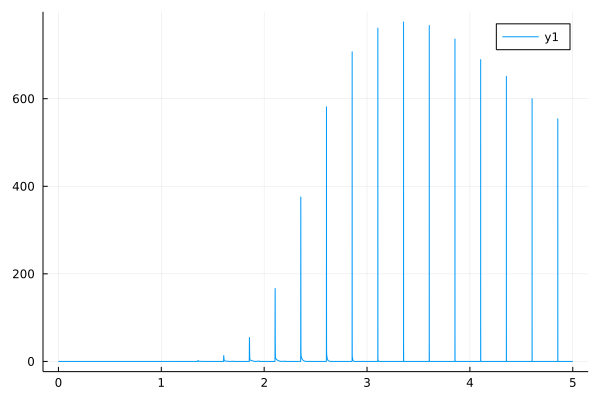

In [570]:
residuals = sol_best[:I_out] - data
plot(sol_best.t, abs.(residuals))

In [571]:
plot(sol_best.t, calculate_loss_robust.(residuals,
                                         c=0.1, #kwargs_loss_robust.c,
                                         α=-3, #p_best["α"]
                                        ))

plot!(sol_best.t, calculate_loss_robust.(residuals,
                                         c=kwargs_loss_robust.c,
                                         α=p_best["α"]
                                        ))